# TASK 6.2.
# Table of Contents
## 1. Import libraries and dataset
## 2. Data wrangling and cleaning
## 3. Exploratory visual analysis
### 3.1. Correlation matrix heatmap 
#### 3.1.1. Data wrangling and enconding
#### 3.1.2. Create correlation matrix heatmap 
#### 3.1.3. Coefficients in the plot mean in terms of the relationships between the variables discussion
### 3.2. Scatterplots
#### 3.2.1. Injury x Antisocial Behavior Scatterplot
#### 3.2.2. Robbery x Street Robbery Scatterplot
#### 3.2.3. Aggravated Assault x Antisocial Behavior Scatterplot
#### 3.2.3. Aggravated Assault x Injury Scatterplot
#### 3.2.4. Scatterplots discussion
### 3.3. Pair plots
#### 3.3.1. Create pair plot
#### 3.3.2. Comment on the distribution of the variables and mark variables I’d like to explore further and why
### 3.4. Categorical plots
#### 3.4.1. Create a categorical plot
#### 3.4.2. Results interpretation
### 3.5. New questions
#### 3.5.1. Answering project questions
#### 3.5.2. New questions
### 3.6. Hypothesis
## 4. Save graphs

---

## 1. Import libraries and dataset

In [65]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [9]:
# Create path
path = '/Users/mariliamachado/Documents/CareerFoundry/Data Immersion/Achievement 6'

In [10]:
# Import dataset
df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'Berlin_crimes_clean.csv'))

In [11]:
df.head()

,Unnamed: 0,Year,District,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car_theft,Car_burglary,Bike_theft,Burglary,Fire,Arson,Damage,Graffiti,Drugs_possession,Antisocial_behavior
0,0,2012,Mitte,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,1,2012,Mitte,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,2,2012,Mitte,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,3,2012,Mitte,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,4,2012,Mitte,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


## 2. Data wrangling and cleaning

In [13]:
# Drop Unnamed column
df = df.drop(columns = ['Unnamed: 0'])
df.head()

,Year,District,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car_theft,Car_burglary,Bike_theft,Burglary,Fire,Arson,Damage,Graffiti,Drugs_possession,Antisocial_behavior
0,2012,Mitte,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,2012,Mitte,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,2012,Mitte,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,2012,Mitte,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,2012,Mitte,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403


In [14]:
df.columns

Index(['Year', 'District', 'Location', 'Robbery', 'Street_robbery', 'Injury',
       'Agg_assault', 'Threat', 'Theft', 'Car_theft', 'Car_burglary',
       'Bike_theft', 'Burglary', 'Fire', 'Arson', 'Damage', 'Graffiti',
       'Drugs_possession', 'Antisocial_behavior'],
      dtype='object')

In [15]:
df.shape

(1200, 19)

In [16]:
df.dtypes

Year                    int64
District               object
Location               object
Robbery                 int64
Street_robbery          int64
Injury                  int64
Agg_assault             int64
Threat                  int64
Theft                   int64
Car_theft               int64
Car_burglary            int64
Bike_theft              int64
Burglary                int64
Fire                    int64
Arson                   int64
Damage                  int64
Graffiti                int64
Drugs_possession        int64
Antisocial_behavior     int64
dtype: object

In [67]:
# Drop Year column
df_2 = df.drop(columns = ['Year'])
df_2

,District,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car_theft,Car_burglary,Bike_theft,Burglary,Fire,Arson,Damage,Graffiti,Drugs_possession,Antisocial_behavior
0,Mitte,Tiergarten Süd,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,Mitte,Regierungsviertel,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,Mitte,Alexanderplatz,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,Mitte,Brunnenstraße Süd,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,Mitte,Moabit West,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,Reinickendorf,Nord 2 - Waidmannslust/Wittenau/Lübars,34,19,372,85,123,1160,30,135,150,93,16,3,306,74,110,728
1196,Reinickendorf,MV 1 - Märkisches Viertel,42,22,491,123,187,1100,51,224,76,40,39,19,286,11,73,986
1197,Reinickendorf,MV 2 - Rollbergsiedlung,6,4,84,19,34,293,13,36,18,34,5,2,156,56,21,212
1198,Reinickendorf,West 3 - Borsigwalde/Freie Scholle,8,4,95,18,43,492,21,96,69,38,6,1,79,8,31,218


## 3. Exploratory visual analysis
### 3.1. Correlation matrix heatmap 

In [87]:
# Remove categorical variables
df4 = df_2.drop(columns = ['District', 'Location'])

In [77]:
df4.corr()

,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car_theft,Car_burglary,Bike_theft,Burglary,Fire,Arson,Damage,Graffiti,Drugs_possession,Antisocial_behavior
Robbery,1.000000,0.965608,0.844837,0.883106,0.777466,0.815009,0.342169,0.675264,0.648652,0.543606,0.654357,0.597664,0.783825,0.569319,0.747885,0.855220
Street_robbery,0.965608,1.000000,0.784158,0.837524,0.692007,0.765908,0.290983,0.606269,0.618891,0.457082,0.600143,0.544589,0.724630,0.544550,0.764422,0.789733
Injury,0.844837,0.784158,1.000000,0.967405,0.915159,0.869828,0.431050,0.712120,0.652590,0.521500,0.747471,0.662397,0.889891,0.649696,0.689694,0.960296
Agg_assault,0.883106,0.837524,0.967405,1.000000,0.851831,0.855720,0.344605,0.663261,0.658315,0.499268,0.701673,0.635040,0.864826,0.655803,0.769115,0.933304
Threat,0.777466,0.692007,0.915159,0.851831,1.000000,0.777509,0.505474,0.792768,0.584023,0.604913,0.780427,0.696342,0.843661,0.524570,0.577521,0.921013
Theft,0.815009,0.765908,0.869828,0.855720,0.777509,1.000000,0.430522,0.757152,0.821575,0.575276,0.583157,0.532898,0.838039,0.689312,0.630379,0.884408
Car_theft,0.342169,0.290983,0.431050,0.344605,0.505474,0.430522,1.000000,0.678266,0.439142,0.521042,0.518441,0.444873,0.540312,0.333526,0.163205,0.494903
Car_burglary,0.675264,0.606269,0.712120,0.663261,0.792768,0.757152,0.678266,1.000000,0.628065,0.718560,0.645562,0.577893,0.745722,0.482562,0.463771,0.759215
Bike_theft,0.648652,0.618891,0.652590,0.658315,0.584023,0.821575,0.439142,0.628065,1.000000,0.545048,0.493447,0.462284,0.758031,0.682841,0.547275,0.731918
Burglary,0.543606,0.457082,0.521500,0.499268,0.604913,0.575276,0.521042,0.718560,0.545048,1.000000,0.480895,0.435706,0.607093,0.404423,0.320262,0.598809


#### 3.1.1. Data wrangling and enconding

We have two qualitative variables which cannot be correlated, however I want to know if there is a correlation between Berlin areas and certain crimes. Therefore, I will drop the location column (there are too many values) and encode the District column.


In [27]:
# Drop Location column
df_3 = df_2.drop(columns = ['Location'])
df_3

,District,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car_theft,Car_burglary,Bike_theft,Burglary,Fire,Arson,Damage,Graffiti,Drugs_possession,Antisocial_behavior
0,Mitte,70,46,586,194,118,2263,18,328,120,68,16,4,273,26,171,1032
1,Mitte,65,29,474,123,142,3203,10,307,170,37,10,4,380,124,98,870
2,Mitte,242,136,1541,454,304,8988,81,792,822,275,49,27,1538,522,435,3108
3,Mitte,52,25,254,60,66,1916,86,192,396,131,14,5,428,122,213,752
4,Mitte,130,51,629,185,199,2470,94,410,325,161,42,22,516,64,259,1403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,Reinickendorf,34,19,372,85,123,1160,30,135,150,93,16,3,306,74,110,728
1196,Reinickendorf,42,22,491,123,187,1100,51,224,76,40,39,19,286,11,73,986
1197,Reinickendorf,6,4,84,19,34,293,13,36,18,34,5,2,156,56,21,212
1198,Reinickendorf,8,4,95,18,43,492,21,96,69,38,6,1,79,8,31,218


In [29]:
# Encode District column
df_encoded = pd.get_dummies(df_3, columns=['District'], drop_first=True)


#### 3.1.2. Create correlation matrix heatmap 

In [31]:
# Calculate the correlation matrix
correlation_matrix = df_encoded.corr()

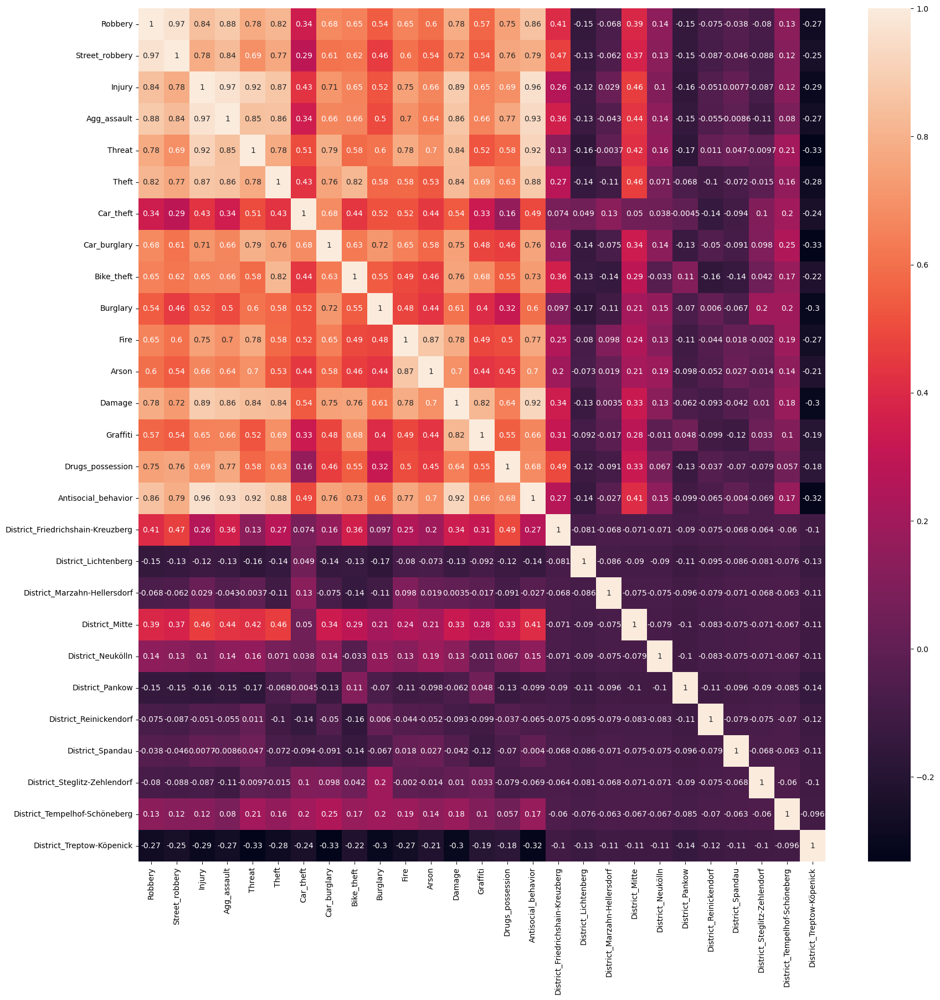

In [33]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(20,20))

# Create the correlation heatmap in seaborn 
corr = sns.heatmap(correlation_matrix, annot = True, ax = ax) 

#### 3.1.3. Coefficients in the plot mean in terms of the relationships between the variables discussion
The coefficients in the plot show the strength and direction of the relationships between variables. A value of 1 means a perfect positive relationship, which only happens when a variable is compared with itself. A value of 0 means there’s no correlation at all. Correlations are considered weak between 0.1 and 0.3, moderate between 0.3 and 0.5, and strong from 0.5 to 1. Conversely, coefficients also range between -1 and 0, -1 being a perfect negative relationship, with -0.5 to -1 being a strong negative relationship, moderate between -0.3 and -0.5 and between -0.1 and -0.3 is a weak negative relationship.

In this plot, there’s a strong correlation between street robbery and general robbery, which makes sense given their similarities. It seems that certain districts and specific crimes don’t show strong relationships, but there are moderate correlations, for example, street robbery and drug possession in Kreuzberg/Friedrichshain, or theft and injury in Mitte.

### 3.2. Scatterplots


#### 3.2.1. Injury x Antisocial Behavior Scatterplot

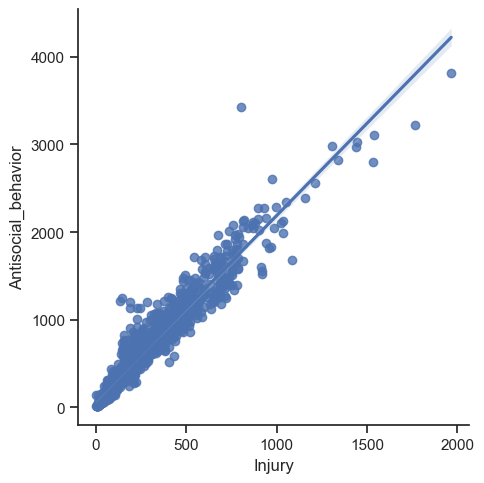

In [85]:
# Create a scatterplot for the Injury" and "Antisocial_behavior" columns 

scatterplot_injury_antisocial = sns.lmplot(x = 'Injury', y = 'Antisocial_behavior', data = df_2)
plt.show()

#### 3.2.2. Robbery x Street Robbery Scatterplot


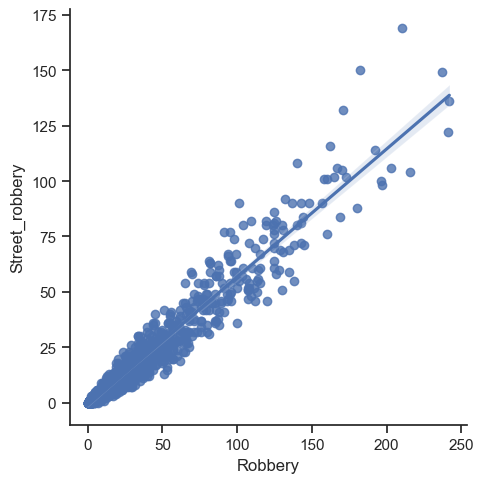

In [83]:
scatterplot_robbery_street = sns.lmplot(x = 'Robbery', y = 'Street_robbery', data = df_2)
plt.show()

#### 3.2.3. Aggravated Assault x Antisocial Behavior Scatterplot

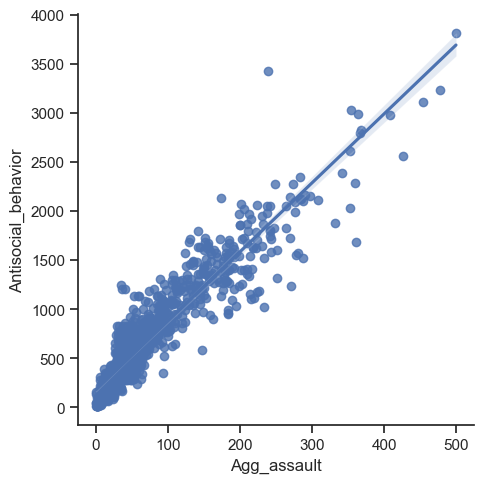

In [81]:
scatterplot_aggassult_antisocial = sns.lmplot(x = 'Agg_assault', y = 'Antisocial_behavior', data = df_2)
plt.show()

#### 3.2.3. Aggravated Assault x Injury Scatterplot

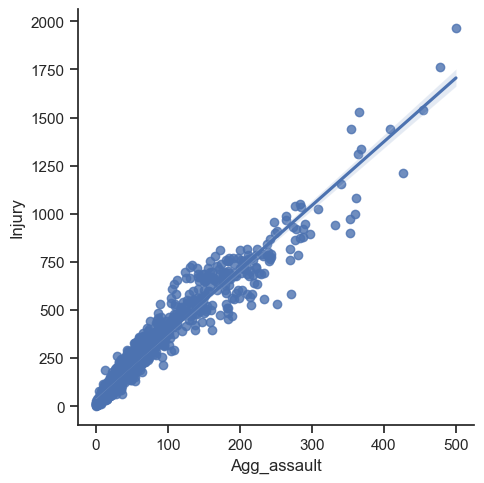

In [63]:
scatterplot_aggassault_injury = sns.lmplot(x = 'Agg_assault', y = 'Injury', data = df_2)
plt.show()

#### 3.2.4. Threat x Car burglary x Treptow-Köpenick district


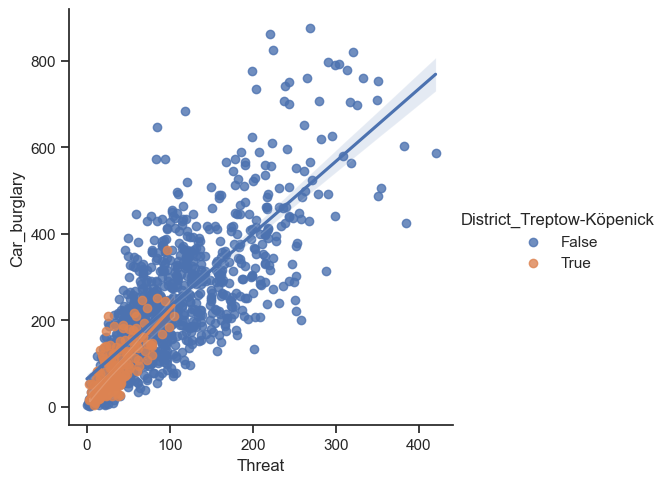

In [61]:
scatterplot_carburglary_threat = sns.lmplot(x = 'Threat', y = 'Car_burglary', hue = 'District_Treptow-Köpenick', data = df_encoded)
plt.show()

#### 3.2.4. Scatterplots discussion
All the scatterplots show a strong linear relationship, since the trend line is steep and goes upward. The first 4 scatterplots have a strong positive relationship, since the data points are very near the line and there aren't many outliers. This means when one variable increases, so does the other.  
Regarding the last scatterplot, since the district is a qualitative variable, I gathered two quantitative variables for the axis and district for the hue. While threat and car burglary have a positive relationship, meaning if one values rise, so does the other, in relation to the Treptow-Köpenick district, it seems these variables have a negative strong relationship, meaning that these crimes are not common in this area.

#### 3.3. Pair plots

#### 3.3.1. Create pair plot

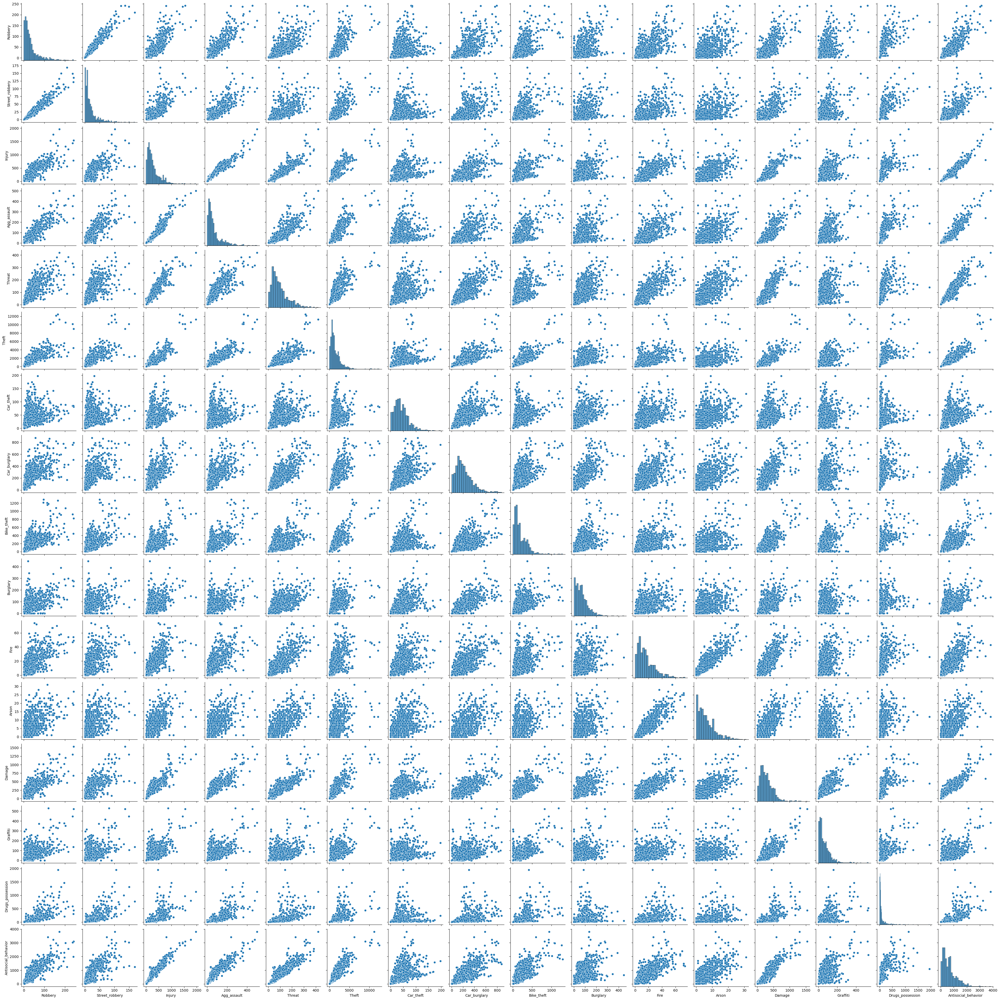

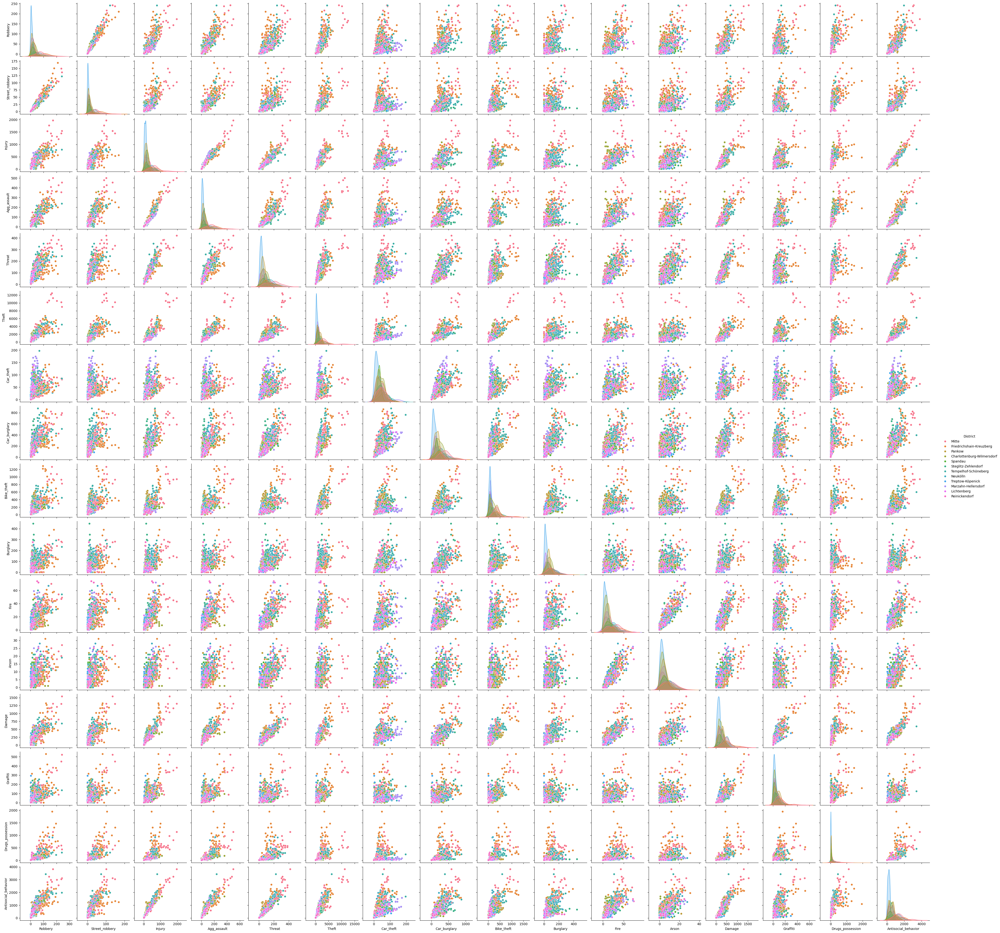

In [45]:
# Create a pair plot 

pairplot1 = sns.pairplot(df_2)
plt.show()

pairplot2 = sns.pairplot(df_2, hue="District")
plt.show()

#### 3.3.2. Comment on the distribution of the variables and mark variables I’d like to explore further and why

I'd like to explore possible relationships between antisocial behavior and other crimes, since a lot of the this variable's plots show a possible connection. Of course, there seems to be strong relationships between the crimes of fire and arson, aggravated assault x threat or injury, as well as robbery, street robbery and different types of theft, but these relationships seem obvious, so I'm not sure I will pursue it. I see possible connections between theft and injury, aggravated assault and threat, so it'd be interesting to research if theft crimes lead to violent crimes.  
Regarding districts, there seems to be an agglomeration of linear several data points in Neukölln, Kreuzberg/Friedrichshain and Lichtenberg for several crimes. For some kinds of theft (general or bike and car), I also see a possible connection with Marzahn-Hellersdor, however, it's difficult to see  the relationship with geographical areas due to the big number of locations present in the dataset.  
My choices were based on how close the data points are together, especially if presented linearly. 

### 3.4. Categorical plots

#### 3.4.1. Create a categorical plot

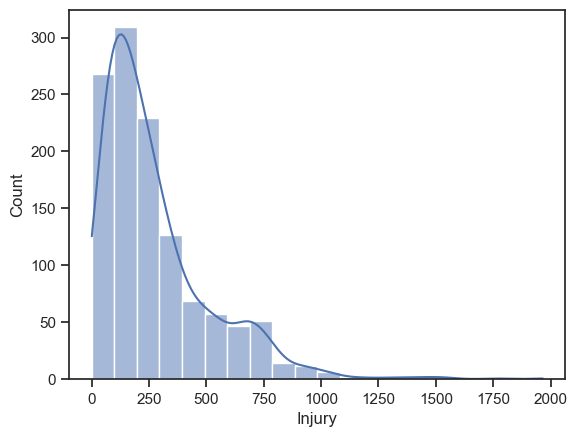

In [59]:
# Create histogram
hist_injury = sns.histplot(df_2['Injury'], bins = 20, kde = True)

In [47]:
# Create histogram ranges
df_2.loc[df_2['Injury'] < 100, 'Injury_police_reports'] = 'Low'
df_2.loc[(df_2['Injury'] >= 100) & (df_2['Injury'] < 200), 'Injury_police_reports'] = 'Average'
df_2.loc[df_2['Injury'] >= 200, 'Injury_police_reports'] = 'High'



In [48]:
# Check new column
df_2['Injury_police_reports'].value_counts(dropna = False)

Injury_police_reports
High       617
Average    312
Low        271
Name: count, dtype: int64

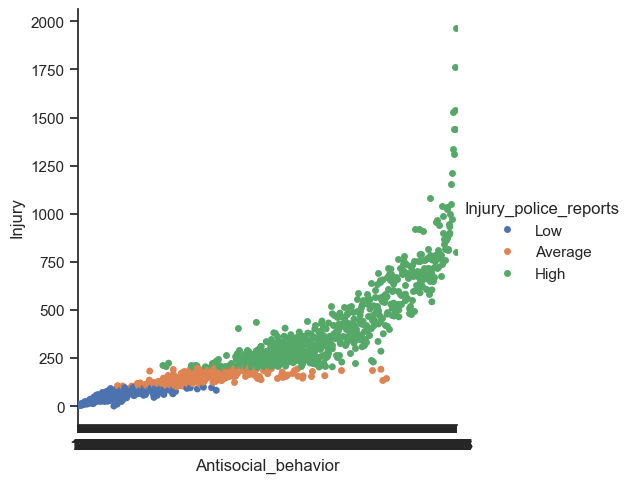

In [49]:
# Create a categorical plot

sns.set(style="ticks")
categorical_plot = sns.catplot(x="Antisocial_behavior", y="Injury", hue="Injury_police_reports", data=df_2)
plt.show()

#### 3.4.2. Results interpretation

It seems that crimes by antisocial_behavior seem to have a high number of reports by injury. Average and low number of reports by injury are in the lower end of the antisocial_behavior axis, there is a strong positive correlation between these two variables.

### 3.5. Project questions

#### 3.5.1. Answering project questions

- **What is the Berlin area with the most small-scale crimes?**
Maybe Mitte, but I need to do more research.

- **Is there a correlation between the type of crime and specific Berlin districts?**
There seems to be a connection between drugs possession and street robbery and Kreuzberg/Friedrichshain, as well as injury and theft in Mitte.


A lot of the other questions were time-related or I needed an analysis of more specific locations, which I didn't do here.

#### 3.5.2. New questions

- Is there a relationship between people reported for antisocial behaviour and every other low-scale crime?
- Is there a high percentage of low-scale crime in areas like Neukölln and Kreuzberg/Friedrichshain?
- Do theft crimes have a correlation with violent crimes?

### 3.6. Hypothesis

- If an area of Berlin has many reports for antisocial behavior, it will have many reports for other low-scale crimes as well.
- In Kreuzberg/Friedrichshain, there will be more drug possession crimes and street robbery.
- If theft crimes increase, so will violet crimes (injury, aggravated assault)
- If robbery increases, so will increase street robbery and other types of burglary/theft.
- If injury crimes increase, so will aggravated assault crimes.

## 4. Save graphs

In [ ]:
# Save plots
categorical_plot.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'categorical_plot_injury_antisocial.png'))
hist_injury.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'hist_injury.png'))
pairplot1.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'pairplot_quantitative_variables.png'))
papairplot2.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'pairplot_District_quantitative_variables.png'))
scatterplot_carburglary_threat.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'scatterplot_carburglary_threat.png'))
scatterplot_aggassault_injury.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'scatterplot_aggassault_injury.png'))
scatterplot_aggassult_antisocial.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'scatterplot_aggassult_antisocial.png'))
scatterplot_robbery_street.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'scatterplot_robbery_street.png'))
scatterplot_injury_antisocial.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'scatterplot_injury_antisocial.png'))
corr.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'correlation_matrix.png'))
